
Processing model: pythia-70m
Loaded cosine_sims data for Language: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Language: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data for Language: <class 'list'>
metric_data is a list with 6 elements
Loaded cosine_sims data for Safety: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Safety: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data for Safety: <class 'list'>
metric_data is a list with 6 elements
Loaded cosine_sims data for Random: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Random: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data for Random: <class 'list'>
metric_data is a list with 6 elements
Loaded cosine_sims data for Random1: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Random1: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data

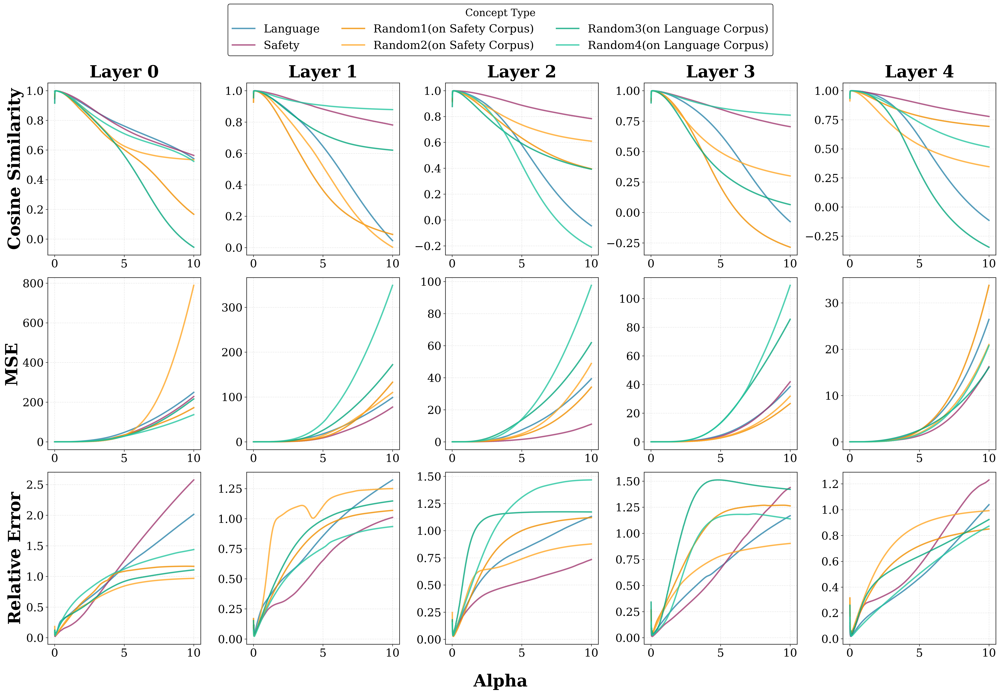

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import torch
import os

# Set publication-quality style
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 13
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['grid.linewidth'] = 0.8
plt.rcParams['lines.linewidth'] = 2

# Define models and their layer counts
models = {
    'pythia-70m': 6,
    # 'pythia-160m': 12
}

# Define a sophisticated color palette
colors = {
    'Language': '#2E86AB',  # Professional blue
    'Safety': '#A23B72',     # Deep magenta
    'Random': '#F18F01',     # Warm orange
    'Random1': '#FFA726',    # Similar orange (lighter)
    'Random2': '#06A77D',    # Teal
    'Random3': '#26C6A0'     # Similar teal (lighter)
}

concept_dict = {
    'Language': 'Language',
    'Safety': 'Safety',
    'Random': 'Random1(on Safety Corpus)',
    'Random1': 'Random2(on Safety Corpus)',
    'Random2': 'Random3(on Language Corpus)',
    'Random3': 'Random4(on Language Corpus)'
}

concept_categories = ['language_en_fr', 'safety', 'random', 'random1', 'random2', 'random3']
concept_names = ['Language', 'Safety', 'Random', 'Random1', 'Random2', 'Random3']

# Metrics to visualize
metrics = ['cosine_sims', 'mses', 'rel_errs']
metric_labels = {
    'cosine_sims': 'Cosine Similarity',
    'mses': 'MSE',
    'rel_errs': 'Relative Error'
}

# Create figure for each model
for model_name, num_layers in models.items():
    print(f"\nProcessing model: {model_name}")
    # Create a figure with subplots for each metric
    fig, axes = plt.subplots(len(metrics), num_layers - 1, figsize=(5 * (num_layers - 1), 5 * len(metrics)), dpi=300)
    
    # Load approximation results for all concepts and metrics
    approx_results = {}
    for concept_cat, concept_name in zip(concept_categories, concept_names):
        approx_results[concept_name] = {}
        for metric in metrics:
            metric_path = f"../../assets/approx/{model_name}/{metric}_{concept_cat}.pt"
            try:
                metric_data = torch.load(metric_path)
                print(f"Loaded {metric} data for {concept_name}: {type(metric_data)}")
                
                # Check if metric_data is a dict or a list
                if isinstance(metric_data, dict):
                    print(f"Keys in metric_data: {metric_data.keys()}")
                    approx_results[concept_name][metric] = metric_data
                elif isinstance(metric_data, list):
                    print(f"metric_data is a list with {len(metric_data)} elements")
                    # Convert list to dict with layer indices as keys
                    # Assuming the list index corresponds to layer index
                    approx_results[concept_name][metric] = {i: metric_data[i] for i in range(len(metric_data))}
                else:
                    print(f"Keys in metric_data: Not a dict or list")
                    approx_results[concept_name][metric] = {}
                
            except Exception as e:
                approx_results[concept_name][metric] = {}
    
    # Get alpha values (assuming alpha_factor=1000 and alpha_min=0.01)
    alpha_factor = 1000
    alpha_min = 0.01
    alpha_values = alpha_min * np.arange(1, alpha_factor + 1)
    
    # Plot each metric in a row
    for metric_idx, metric in enumerate(metrics):
        for layer_idx in range(num_layers-1):
            ax = axes[metric_idx, layer_idx] if len(metrics) > 1 else axes[layer_idx]
            
            for concept_name in concept_names:
                if concept_name in approx_results and metric in approx_results[concept_name] and layer_idx in approx_results[concept_name][metric]:
                    metric_values = approx_results[concept_name][metric][layer_idx]
                    if len(metric_values) > 0:
                        print(f"Plotting {concept_name} {metric} layer {layer_idx}: {len(metric_values)} points")
                        # Plot metric line
                        ax.plot(alpha_values[:len(metric_values)], metric_values, 
                               color=colors[concept_name], 
                               label=concept_dict[concept_name], 
                               linewidth=2.5, alpha=0.8)
                    else:
                        print(f"No data for {concept_name} {metric} layer {layer_idx}")
                else:
                    print(f"Missing data for {concept_name} {metric} layer {layer_idx}")
            
            ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
            ax.set_axisbelow(True)
            if metric_idx == 0:
                ax.set_title(f'Layer {layer_idx}', fontweight='bold', pad=10, fontsize=30)
            if layer_idx == 0:
                ax.set_ylabel(metric_labels[metric], fontweight='bold', fontsize=30)
            for spine in ax.spines.values():
                spine.set_linewidth(1.2)
                spine.set_color('#333333')
    
    # Add a single shared x-axis label at the bottom center
    fig.text(0.5, -0.02, 'Alpha', ha='center', fontweight='bold', fontsize=30)
    
    # Create a single legend at the top of the figure
    handles, labels = (axes[0, 0] if len(metrics) > 1 else axes[0]).get_legend_handles_labels()
    if len(handles) > 0:
        fig.legend(handles, labels, title='Concept Type', loc='upper center', 
                   bbox_to_anchor=(0.5, 1.12), ncol=3, frameon=True, 
                   fancybox=True, shadow=False, framealpha=0.95, 
                   edgecolor='black', fontsize=20, title_fontsize=18)
    else:
        print("Warning: No legend handles found - no data was plotted!")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.98, bottom=0.05)  # Make room for the legend at the top and x-label at bottom
    os.makedirs(f'../../assets/figs/approx/', exist_ok=True)
    plt.savefig(f'../../assets/figs/approx/{model_name}_all_metrics_by_layer.pdf', format='pdf', bbox_inches='tight', dpi=300)
    plt.show()


In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import torch
import os

# Set publication-quality style
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 13
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['grid.linewidth'] = 0.8
plt.rcParams['lines.linewidth'] = 2

# Define model
model_name = 'pythia-160m'
num_layers = 12

# Define a sophisticated color palette
colors = {
    'Language': '#2E86AB',  # Professional blue
    'Safety': '#A23B72',     # Deep magenta
    'Random': '#F18F01',     # Warm orange
    'Random1': '#FFA726',    # Similar orange (lighter)
    'Random2': '#06A77D',    # Teal
    'Random3': '#26C6A0'     # Similar teal (lighter)
}

concept_dict = {
    'Language': 'Language',
    'Safety': 'Safety',
    'Random': 'Random1(on Safety Corpus)',
    'Random1': 'Random2(on Safety Corpus)',
    'Random2': 'Random3(on Language Corpus)',
    'Random3': 'Random4(on Language Corpus)'
}

concept_categories = ['language_en_fr', 'safety', 'random', 'random1', 'random2', 'random3']
concept_names = ['Language', 'Safety', 'Random', 'Random1', 'Random2', 'Random3']

# Metrics to visualize
metrics = ['cosine_sims', 'mses', 'rel_errs']
metric_labels = {
    'cosine_sims': 'Cosine Similarity',
    'mses': 'MSE',
    'rel_errs': 'Relative Error'
}

print(f"\nProcessing model: {model_name}")

# Create a figure with 2 rows per metric (6 rows total), and 6 columns (layers 0-5 in row 1, layers 6-10 in row 2)
num_cols = 6
num_rows = len(metrics) * 2  # 2 rows per metric
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows), dpi=300)

# Load approximation results for all concepts and metrics
approx_results = {}
for concept_cat, concept_name in zip(concept_categories, concept_names):
    approx_results[concept_name] = {}
    for metric in metrics:
        metric_path = f"../../assets/approx/{model_name}/{metric}_{concept_cat}.pt"
        try:
            metric_data = torch.load(metric_path)
            print(f"Loaded {metric} data for {concept_name}: {type(metric_data)}")
            
            # Check if metric_data is a dict or a list
            if isinstance(metric_data, dict):
                print(f"Keys in metric_data: {metric_data.keys()}")
                approx_results[concept_name][metric] = metric_data
            elif isinstance(metric_data, list):
                print(f"metric_data is a list with {len(metric_data)} elements")
                # Convert list to dict with layer indices as keys
                approx_results[concept_name][metric] = {i: metric_data[i] for i in range(len(metric_data))}
            else:
                print(f"Keys in metric_data: Not a dict or list")
                approx_results[concept_name][metric] = {}
            
        except Exception as e:
            approx_results[concept_name][metric] = {}

# Get alpha values (assuming alpha_factor=1000 and alpha_min=0.01)
alpha_factor = 1000
alpha_min = 0.01
alpha_values = alpha_min * np.arange(1, alpha_factor + 1)

# Plot each metric in 2 rows
for metric_idx, metric in enumerate(metrics):
    # First row: layers 0-5
    for col_idx in range(num_cols):
        layer_idx = col_idx
        if layer_idx >= num_layers - 1:
            # Hide unused subplots
            axes[metric_idx * 2, col_idx].axis('off')
            continue
            
        ax = axes[metric_idx * 2, col_idx]
        
        for concept_name in concept_names:
            if concept_name in approx_results and metric in approx_results[concept_name] and layer_idx in approx_results[concept_name][metric]:
                metric_values = approx_results[concept_name][metric][layer_idx]
                if len(metric_values) > 0:
                    print(f"Plotting {concept_name} {metric} layer {layer_idx}: {len(metric_values)} points")
                    # Plot metric line
                    ax.plot(alpha_values[:len(metric_values)], metric_values, 
                           color=colors[concept_name], 
                           label=concept_dict[concept_name], 
                           linewidth=2.5, alpha=0.8)
                else:
                    print(f"No data for {concept_name} {metric} layer {layer_idx}")
            else:
                print(f"Missing data for {concept_name} {metric} layer {layer_idx}")
        
        ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
        ax.set_axisbelow(True)
        ax.set_title(f'Layer {layer_idx}', fontweight='bold', pad=10, fontsize=30)
        if col_idx == 0:
            ax.set_ylabel(metric_labels[metric], fontweight='bold', fontsize=30)
        for spine in ax.spines.values():
            spine.set_linewidth(1.2)
            spine.set_color('#333333')
    
    # Second row: layers 6-10
    for col_idx in range(num_cols):
        layer_idx = col_idx + 6
        if layer_idx >= num_layers - 1:
            # Hide unused subplots
            axes[metric_idx * 2 + 1, col_idx].axis('off')
            continue
            
        ax = axes[metric_idx * 2 + 1, col_idx]
        
        for concept_name in concept_names:
            if concept_name in approx_results and metric in approx_results[concept_name] and layer_idx in approx_results[concept_name][metric]:
                metric_values = approx_results[concept_name][metric][layer_idx]
                if len(metric_values) > 0:
                    print(f"Plotting {concept_name} {metric} layer {layer_idx}: {len(metric_values)} points")
                    # Plot metric line
                    ax.plot(alpha_values[:len(metric_values)], metric_values, 
                           color=colors[concept_name], 
                           label=concept_dict[concept_name], 
                           linewidth=2.5, alpha=0.8)
                else:
                    print(f"No data for {concept_name} {metric} layer {layer_idx}")
            else:
                print(f"Missing data for {concept_name} {metric} layer {layer_idx}")
        
        ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
        ax.set_axisbelow(True)
        ax.set_title(f'Layer {layer_idx}', fontweight='bold', pad=10, fontsize=30)
        if col_idx == 0:
            ax.set_ylabel(metric_labels[metric], fontweight='bold', fontsize=30)
        for spine in ax.spines.values():
            spine.set_linewidth(1.2)
            spine.set_color('#333333')

# Add a single shared x-axis label at the bottom center
fig.text(0.5, -0.02, 'Alpha', ha='center', fontweight='bold', fontsize=30)

# Create a single legend at the top of the figure
handles, labels = axes[0, 0].get_legend_handles_labels()
if len(handles) > 0:
    fig.legend(handles, labels, title='Concept Type', loc='upper center', 
               bbox_to_anchor=(0.5, 1.05), ncol=3, frameon=True, 
               fancybox=True, shadow=False, framealpha=0.95, 
               edgecolor='black', fontsize=20, title_fontsize=18)
else:
    print("Warning: No legend handles found - no data was plotted!")

plt.tight_layout()
plt.subplots_adjust(top=0.98, bottom=0.05)  # Make room for the legend at the top and x-label at bottom
os.makedirs(f'../../assets/figs/approx/', exist_ok=True)
plt.savefig(f'../../assets/figs/approx/{model_name}_all_metrics_by_layer.pdf', format='pdf', bbox_inches='tight', dpi=300)
plt.show()



Processing model: pythia-160m
Loaded cosine_sims data for Language: <class 'list'>
metric_data is a list with 12 elements
Loaded mses data for Language: <class 'list'>
metric_data is a list with 12 elements
Loaded rel_errs data for Language: <class 'list'>
metric_data is a list with 12 elements
Loaded cosine_sims data for Safety: <class 'list'>
metric_data is a list with 12 elements
Loaded mses data for Safety: <class 'list'>
metric_data is a list with 12 elements
Loaded rel_errs data for Safety: <class 'list'>
metric_data is a list with 12 elements
Loaded cosine_sims data for Random: <class 'list'>
metric_data is a list with 12 elements
Loaded mses data for Random: <class 'list'>
metric_data is a list with 12 elements
Loaded rel_errs data for Random: <class 'list'>
metric_data is a list with 12 elements
Loaded cosine_sims data for Random1: <class 'list'>
metric_data is a list with 12 elements
Loaded mses data for Random1: <class 'list'>
metric_data is a list with 12 elements
Loaded r


Processing model: pythia-70m
Loaded cosine_sims data for Language: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Language: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data for Language: <class 'list'>
metric_data is a list with 6 elements
Loaded cosine_sims data for Safety: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Safety: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data for Safety: <class 'list'>
metric_data is a list with 6 elements
Loaded cosine_sims data for Random: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Random: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data for Random: <class 'list'>
metric_data is a list with 6 elements
Loaded cosine_sims data for Random1: <class 'list'>
metric_data is a list with 6 elements
Loaded mses data for Random1: <class 'list'>
metric_data is a list with 6 elements
Loaded rel_errs data

/tmp/ipykernel_184881/4174491458.py:176: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


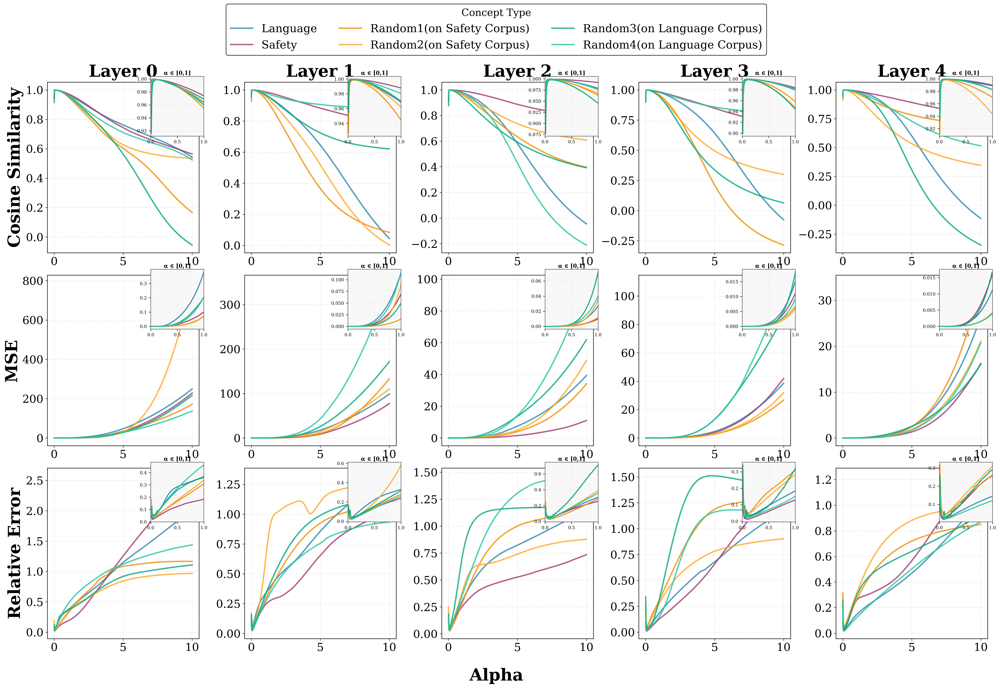

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import torch
import os
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Set publication-quality style
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 13
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['grid.linewidth'] = 0.8
plt.rcParams['lines.linewidth'] = 2

# Define models and their layer counts
models = {
    'pythia-70m': 6,
    # 'pythia-160m': 12
}

# Define a sophisticated color palette
colors = {
    'Language': '#2E86AB',  # Professional blue
    'Safety': '#A23B72',     # Deep magenta
    'Random': '#F18F01',     # Warm orange
    'Random1': '#FFA726',    # Similar orange (lighter)
    'Random2': '#06A77D',    # Teal
    'Random3': '#26C6A0'     # Similar teal (lighter)
}

concept_dict = {
    'Language': 'Language',
    'Safety': 'Safety',
    'Random': 'Random1(on Safety Corpus)',
    'Random1': 'Random2(on Safety Corpus)',
    'Random2': 'Random3(on Language Corpus)',
    'Random3': 'Random4(on Language Corpus)'
}

concept_categories = ['language_en_fr', 'safety', 'random', 'random1', 'random2', 'random3']
concept_names = ['Language', 'Safety', 'Random', 'Random1', 'Random2', 'Random3']

# Metrics to visualize
metrics = ['cosine_sims', 'mses', 'rel_errs']
metric_labels = {
    'cosine_sims': 'Cosine Similarity',
    'mses': 'MSE',
    'rel_errs': 'Relative Error'
}

# Create figure for each model
for model_name, num_layers in models.items():
    print(f"\nProcessing model: {model_name}")
    # Create a figure with subplots for each metric
    fig, axes = plt.subplots(len(metrics), num_layers - 1, figsize=(5 * (num_layers - 1), 5 * len(metrics)), dpi=300)
    
    # Load approximation results for all concepts and metrics
    approx_results = {}
    for concept_cat, concept_name in zip(concept_categories, concept_names):
        approx_results[concept_name] = {}
        for metric in metrics:
            metric_path = f"../../assets/approx/{model_name}/{metric}_{concept_cat}.pt"
            try:
                metric_data = torch.load(metric_path)
                print(f"Loaded {metric} data for {concept_name}: {type(metric_data)}")
                
                # Check if metric_data is a dict or a list
                if isinstance(metric_data, dict):
                    print(f"Keys in metric_data: {metric_data.keys()}")
                    approx_results[concept_name][metric] = metric_data
                elif isinstance(metric_data, list):
                    print(f"metric_data is a list with {len(metric_data)} elements")
                    # Convert list to dict with layer indices as keys
                    # Assuming the list index corresponds to layer index
                    approx_results[concept_name][metric] = {i: metric_data[i] for i in range(len(metric_data))}
                else:
                    print(f"Keys in metric_data: Not a dict or list")
                    approx_results[concept_name][metric] = {}
                
            except Exception as e:
                approx_results[concept_name][metric] = {}
    
    # Get alpha values (assuming alpha_factor=1000 and alpha_min=0.01)
    alpha_factor = 1000
    alpha_min = 0.01
    alpha_values = alpha_min * np.arange(1, alpha_factor + 1)
    
    # Plot each metric in a row
    for metric_idx, metric in enumerate(metrics):
        for layer_idx in range(num_layers-1):
            ax = axes[metric_idx, layer_idx] if len(metrics) > 1 else axes[layer_idx]
            
            for concept_name in concept_names:
                if concept_name in approx_results and metric in approx_results[concept_name] and layer_idx in approx_results[concept_name][metric]:
                    metric_values = approx_results[concept_name][metric][layer_idx]
                    if len(metric_values) > 0:
                        print(f"Plotting {concept_name} {metric} layer {layer_idx}: {len(metric_values)} points")
                        # Plot metric line
                        ax.plot(alpha_values[:len(metric_values)], metric_values, 
                               color=colors[concept_name], 
                               label=concept_dict[concept_name], 
                               linewidth=2.5, alpha=0.8)
                    else:
                        print(f"No data for {concept_name} {metric} layer {layer_idx}")
                else:
                    print(f"Missing data for {concept_name} {metric} layer {layer_idx}")
            
            ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
            ax.set_axisbelow(True)
            if metric_idx == 0:
                ax.set_title(f'Layer {layer_idx}', fontweight='bold', pad=10, fontsize=30)
            if layer_idx == 0:
                ax.set_ylabel(metric_labels[metric], fontweight='bold', fontsize=30)
            for spine in ax.spines.values():
                spine.set_linewidth(1.2)
                spine.set_color('#333333')
            
            # Add inset axes in the upper right corner for zoomed view (alpha 0-1)
            axins = inset_axes(ax, width="35%", height="35%", loc='upper right', 
                              bbox_to_anchor=(0.05, 0.05, 1, 1), bbox_transform=ax.transAxes)
            
            # Plot the same data but zoomed to alpha 0-1
            for concept_name in concept_names:
                if concept_name in approx_results and metric in approx_results[concept_name] and layer_idx in approx_results[concept_name][metric]:
                    metric_values = approx_results[concept_name][metric][layer_idx]
                    if len(metric_values) > 0:
                        # Find indices where alpha is between 0 and 1
                        mask = alpha_values[:len(metric_values)] <= 1.0
                        zoomed_alpha = alpha_values[:len(metric_values)][mask]
                        zoomed_values = np.array(metric_values)[mask]
                        
                        if len(zoomed_alpha) > 0:
                            axins.plot(zoomed_alpha, zoomed_values, 
                                      color=colors[concept_name], 
                                      linewidth=2.0, alpha=0.9)
            
            # Add a subtle background color to make the inset stand out
            axins.set_facecolor('#f8f8f8')
            
            # Add a title to the inset to emphasize it's a zoomed view
            axins.set_title('α ∈ [0,1]', fontsize=10, fontweight='bold', pad=3)
            
            # Set limits for the inset
            axins.set_xlim(0, 1)
            # Auto-scale y-axis for the zoomed region
            axins.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
            axins.tick_params(labelsize=8)
            axins.set_axisbelow(True)
            
            # Add a border to the inset
            for spine in axins.spines.values():
                spine.set_linewidth(1.0)
                spine.set_color('#666666')
    
    # Add a single shared x-axis label at the bottom center
    fig.text(0.5, -0.02, 'Alpha', ha='center', fontweight='bold', fontsize=30)
    
    # Create a single legend at the top of the figure
    handles, labels = (axes[0, 0] if len(metrics) > 1 else axes[0]).get_legend_handles_labels()
    if len(handles) > 0:
        fig.legend(handles, labels, title='Concept Type', loc='upper center', 
                   bbox_to_anchor=(0.5, 1.12), ncol=3, frameon=True, 
                   fancybox=True, shadow=False, framealpha=0.95, 
                   edgecolor='black', fontsize=20, title_fontsize=18)
    else:
        print("Warning: No legend handles found - no data was plotted!")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.98, bottom=0.05)  # Make room for the legend at the top and x-label at bottom
    os.makedirs(f'../../assets/figs/approx/', exist_ok=True)
    plt.savefig(f'../../assets/figs/approx/{model_name}_all_metrics_by_layer_revised.pdf', format='pdf', bbox_inches='tight', dpi=300)
    plt.show()
